# **Imports and Libraries :**

In [1]:
import warnings
warnings.filterwarnings("ignore")
import copy
import pandas as pd
import polars as pl
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as exp
from pandas_profiling import ProfileReport
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, RobustScaler ,PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix,classification_report

# **Prepare some functions and methods to use :**

##### 1- Function to get the all values of each column :

In [2]:
def GetValuesCounts(data):
    columns = [col for col in data.columns ]
    for col in columns:
        print(data[col].value_counts(),"\n")

##### 2- Function to get the object (string) Features :

In [3]:
def GetObjectFeatures(data) :
    object_columns = [col for col in data.columns if data[col].dtype == 'object']
    for col in object_columns :
        print(data[col].value_counts(),"\n")

##### 3- Function to "Plot Box Plot" and it works only for the datatype of integer and float columns :

In [4]:
def PBP (data):
    for col in data.select_dtypes(include=['int', 'float']).columns:
        fig, ax = plt.subplots(figsize=(5, 5))
        ax.set_title(f'Boxplot of {col}')
        bp=data.boxplot(column=col)
        plt.show()
        plt.close(fig)

##### 4- Function to Plot Pair Plot with different Hues :

In [5]:
def TribleP(data):
    columns = [col for col in data.columns]
    custom_palette = sns.color_palette("coolwarm", 6)
    for col in columns:
        if data[col].value_counts().count() <= 6:
            sns.pairplot(data, hue=col, palette=custom_palette)
            plt.show()
        else:
            continue

##### 5- Function to Plot Distribution Plot :

In [6]:
def PDP(data):
    columns = [col for col in data.columns]
    colors = sns.color_palette("coolwarm", len(columns))

    for i, col in enumerate(data.select_dtypes(include=['int', 'float']).columns):
        if data[col].value_counts().count() <= 10000:
            sns.histplot(data[col], kde=True, bins=15, color=colors[i % len(colors)])
            plt.title(f'Distribution of {col}')
            plt.show()

##### 6- Function to Plot Pie chart if the feature has values less than or equal 10 :

In [7]:
def PlotPie(data):
    custom_palette = "coolwarm"
    sns.set_palette(custom_palette)
    plt.figure(figsize=(8, 6))
    columns = [col for col in data.columns]
    for col in columns:
        if data[col].value_counts().count() <= 10:
            # Plot pie chart
            plt.figure(figsize=(8,6))
            data[col].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=140)
            plt.title(f"Distribution of {col}")
            plt.ylabel("")
            plt.axis('equal')
            plt.show()
            print("\n\n\n")

##### 7- Function to Plot Scatter plot :

In [8]:
def PlotScatter(data):
    numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns
    plt.figure(figsize=(10, 8))

    for i, col1 in enumerate(numerical_columns):
        for col2 in numerical_columns[i + 1:]:  # Avoid duplicate pairs and self-pairs
            plt.figure(figsize=(10, 8))
            sns.scatterplot(data=data, x=col1, y=col2, alpha=0.7)
            plt.title(f"Scatter Plot: {col1} vs {col2}")
            plt.xlabel(col1)
            plt.ylabel(col2)
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.show()
            print("\n\n\n")

##### 8- Function to visualize the correlation matrix by heatmap :

In [9]:
def PlotCorrelationHeatmap(data):
    numeric_data = data.select_dtypes(include=['int64', 'float64'])
    if numeric_data.shape[1] > 1:
        corr_matrix = numeric_data.corr()
        # Plotting
        plt.figure(figsize=(10, 10))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, cbar=True)
        plt.title("Correlation Heatmap")
        plt.show()
    else:
        print("Not valid to be plotted")

##### 9- Function toEvaluate a model response by Accuracy ,F1 Score , precision , Recall , Confusion Matrix , ROC and the classification report  :

In [10]:
def plot_confusion_matrix_custom(y_test, y_pred):
    CM = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:\n", CM)
    sns.heatmap(CM, annot=True, cmap="coolwarm", fmt='g')
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

def EvaluateModel(y_test, y_pred):
    # Calculate Accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Accuracy: {accuracy:.2f}")

    # Plot Confusion Matrix
    plot_confusion_matrix_custom(y_test, y_pred)

    # Print Precision, Recall, F1-Score
    print(f"Precision: {precision_score(y_test, y_pred, average='weighted'):.4f}")
    print(f"Recall: {recall_score(y_test, y_pred, average='weighted'):.4f}")
    print(f"F1-Score: {f1_score(y_test, y_pred, average='weighted'):.4f}")

    # Print ROC-AUC
    try:
        roc_auc = roc_auc_score(y_test, y_pred, multi_class='ovo')
        print(f"ROC-AUC: {roc_auc:.4f}")
    except ValueError as e:
        print(f"ROC-AUC: Could not be calculated. Reason: {e}")

    # Classification Report
    print("\nClassification Report for the model:\n")
    print(classification_report(y_test, y_pred, target_names=['Salary is over 50k or equal', "Salary is less than 50k"]))
    print('\n' + '-'*60 + '\n')

# **Reading Data :**

In [11]:
df = pd.read_csv('/kaggle/input/salary-prediction-classification/salary.csv')

# **Some of Statistical Anaysis and EDA :**

In [12]:
df.shape

(32561, 15)

In [13]:
len(df)

32561

In [14]:
df.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'salary'],
      dtype='object')

In [15]:
df.head(7)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
5,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
6,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K


In [16]:
df.tail(7)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary
32554,53,Private,321865,Masters,14,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,40,United-States,>50K
32555,22,Private,310152,Some-college,10,Never-married,Protective-serv,Not-in-family,White,Male,0,0,40,United-States,<=50K
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K
32560,52,Self-emp-inc,287927,HS-grad,9,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40,United-States,>50K


In [17]:
df['salary'].value_counts()

salary
 <=50K    24720
 >50K      7841
Name: count, dtype: int64

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education-num   32561 non-null  int64 
 5   marital-status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital-gain    32561 non-null  int64 
 11  capital-loss    32561 non-null  int64 
 12  hours-per-week  32561 non-null  int64 
 13  native-country  32561 non-null  object
 14  salary          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [19]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,32561.0,38.581647,13.640433,17.0,28.0,37.0,48.0,90.0
fnlwgt,32561.0,189778.366512,105549.977697,12285.0,117827.0,178356.0,237051.0,1484705.0
education-num,32561.0,10.080679,2.572720,1.0,9.0,10.0,12.0,16.0
capital-gain,32561.0,1077.648844,7385.292085,0.0,0.0,0.0,0.0,99999.0
capital-loss,32561.0,87.303830,402.960219,0.0,0.0,0.0,0.0,4356.0
hours-per-week,32561.0,40.437456,12.347429,1.0,40.0,40.0,45.0,99.0


In [20]:
for i, col in enumerate(df.select_dtypes(include=['int', 'float']).columns):
    print("Variance for",col,"column :",df[col].var())

Variance for age column : 186.0614002488016
Variance for fnlwgt column : 11140797791.841892
Variance for education-num column : 6.618889907032931
Variance for capital-gain column : 54542539.17840535
Variance for capital-loss column : 162376.9378136497
Variance for hours-per-week column : 152.45899505045418


In [21]:
df.isna().sum()

age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
native-country    0
salary            0
dtype: int64

In [22]:
df.duplicated().sum()

24

In [23]:
GetValuesCounts(df)

age
36    898
31    888
34    886
23    877
35    876
     ... 
83      6
88      3
85      3
86      1
87      1
Name: count, Length: 73, dtype: int64 

workclass
 Private             22696
 Self-emp-not-inc     2541
 Local-gov            2093
 ?                    1836
 State-gov            1298
 Self-emp-inc         1116
 Federal-gov           960
 Without-pay            14
 Never-worked            7
Name: count, dtype: int64 

fnlwgt
123011    13
203488    13
164190    13
148995    12
113364    12
          ..
174981     1
77774      1
134069     1
44777      1
98106      1
Name: count, Length: 21648, dtype: int64 

education
 HS-grad         10501
 Some-college     7291
 Bachelors        5355
 Masters          1723
 Assoc-voc        1382
 11th             1175
 Assoc-acdm       1067
 10th              933
 7th-8th           646
 Prof-school       576
 9th               514
 12th              433
 Doctorate         413
 5th-6th           333
 1st-4th           168
 Preschool       

In [24]:
GetObjectFeatures(df)

workclass
 Private             22696
 Self-emp-not-inc     2541
 Local-gov            2093
 ?                    1836
 State-gov            1298
 Self-emp-inc         1116
 Federal-gov           960
 Without-pay            14
 Never-worked            7
Name: count, dtype: int64 

education
 HS-grad         10501
 Some-college     7291
 Bachelors        5355
 Masters          1723
 Assoc-voc        1382
 11th             1175
 Assoc-acdm       1067
 10th              933
 7th-8th           646
 Prof-school       576
 9th               514
 12th              433
 Doctorate         413
 5th-6th           333
 1st-4th           168
 Preschool          51
Name: count, dtype: int64 

marital-status
 Married-civ-spouse       14976
 Never-married            10683
 Divorced                  4443
 Separated                 1025
 Widowed                    993
 Married-spouse-absent      418
 Married-AF-spouse           23
Name: count, dtype: int64 

occupation
 Prof-specialty       4140
 Craft-r

# Applying Feature Extraction :

In [25]:
# Creating the 'net_capital_flow' feature (capital-gain - capital-loss)
df['net_capital_flow'] = df['capital-gain'] - df['capital-loss']

In [26]:
df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary,net_capital_flow
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,2174
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,0


In [27]:
df['net_capital_flow'].var()

54893087.6375956

In [28]:
GetValuesCounts(df)

age
36    898
31    888
34    886
23    877
35    876
     ... 
83      6
88      3
85      3
86      1
87      1
Name: count, Length: 73, dtype: int64 

workclass
 Private             22696
 Self-emp-not-inc     2541
 Local-gov            2093
 ?                    1836
 State-gov            1298
 Self-emp-inc         1116
 Federal-gov           960
 Without-pay            14
 Never-worked            7
Name: count, dtype: int64 

fnlwgt
123011    13
203488    13
164190    13
148995    12
113364    12
          ..
174981     1
77774      1
134069     1
44777      1
98106      1
Name: count, Length: 21648, dtype: int64 

education
 HS-grad         10501
 Some-college     7291
 Bachelors        5355
 Masters          1723
 Assoc-voc        1382
 11th             1175
 Assoc-acdm       1067
 10th              933
 7th-8th           646
 Prof-school       576
 9th               514
 12th              433
 Doctorate         413
 5th-6th           333
 1st-4th           168
 Preschool       

In [29]:
 profile = ProfileReport(df)
 profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Visualized EDA and Analysis :**

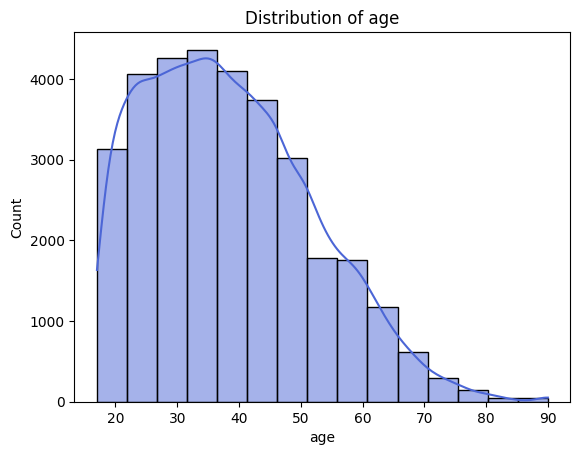

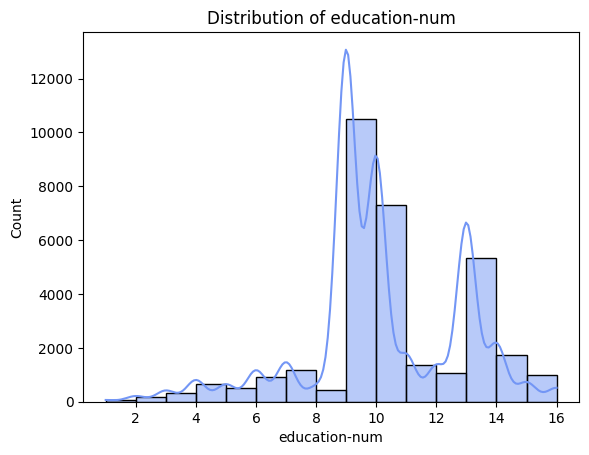

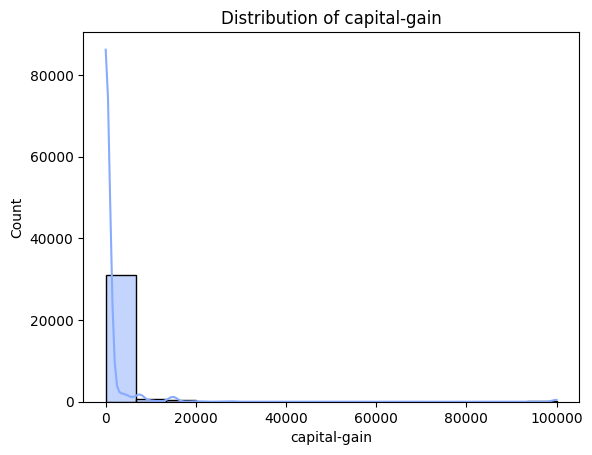

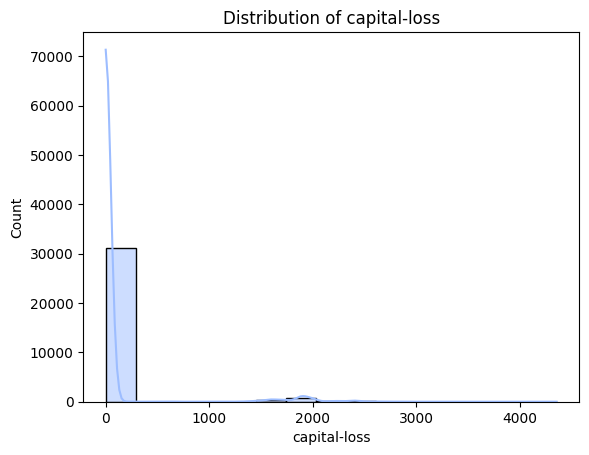

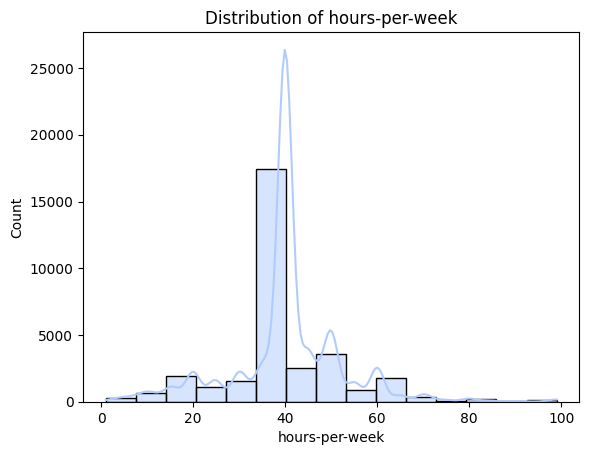

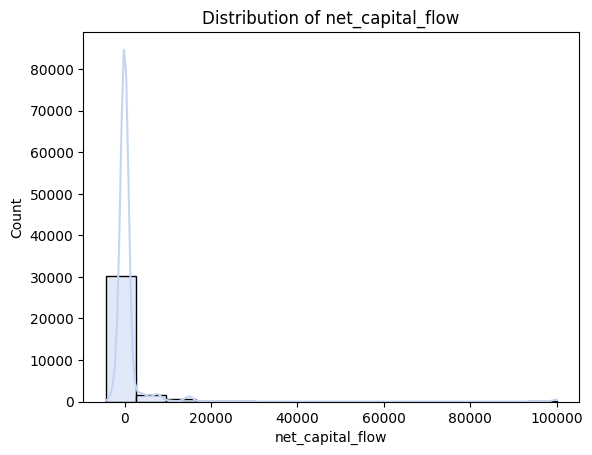

In [30]:
 PDP(df)

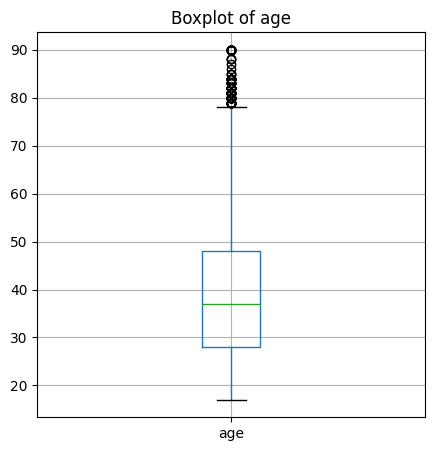

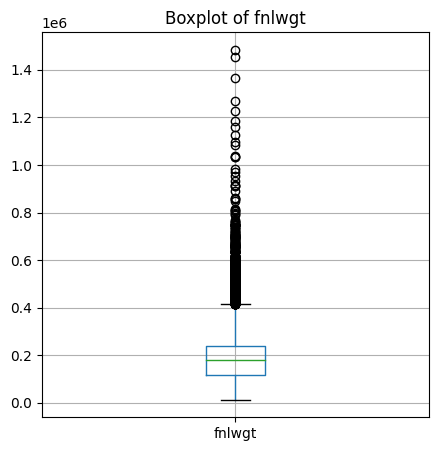

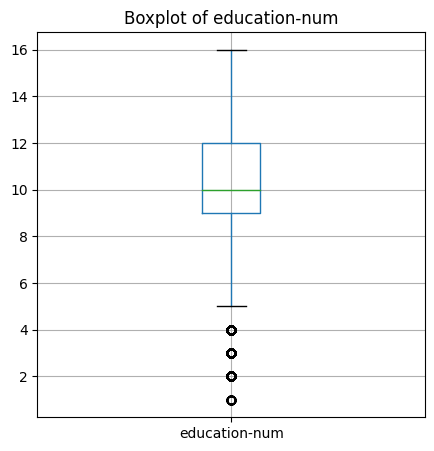

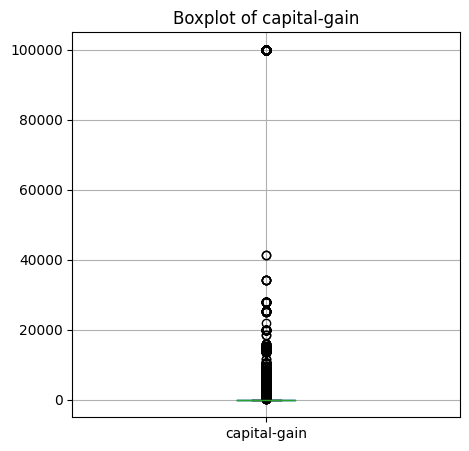

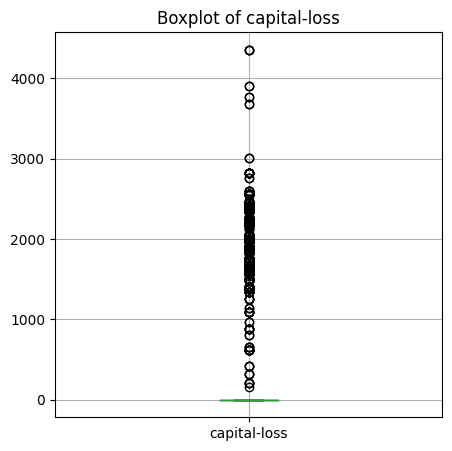

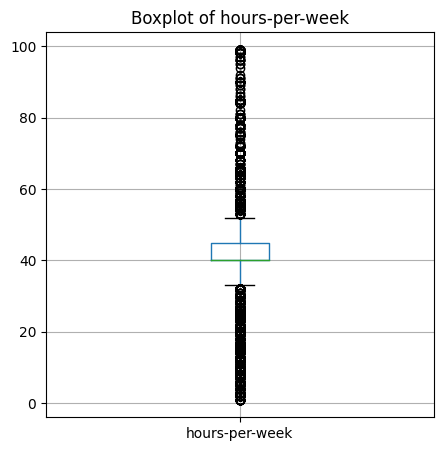

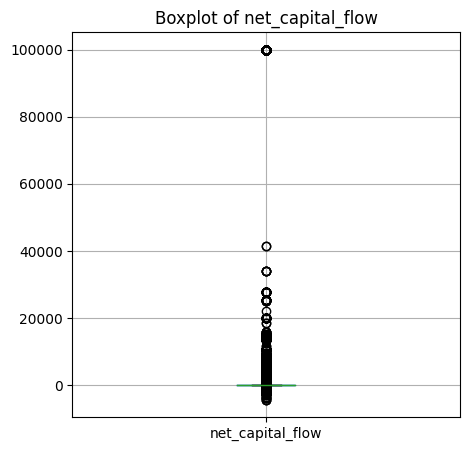

In [31]:
 PBP(df)

<Figure size 800x600 with 0 Axes>

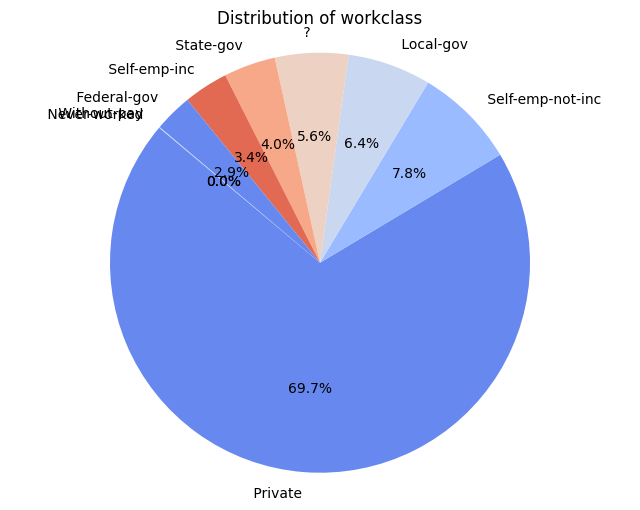

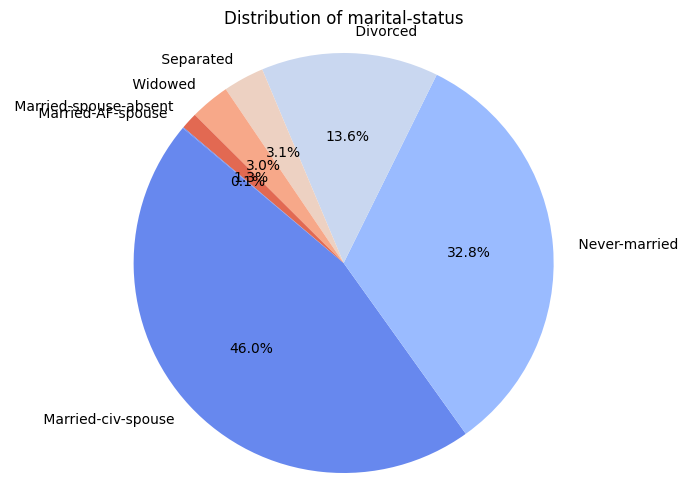

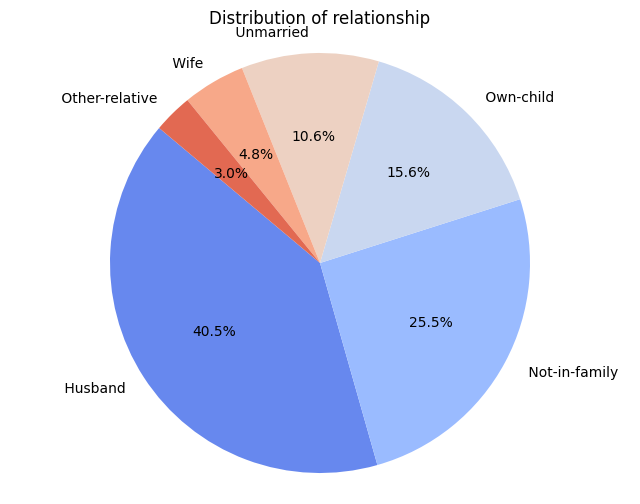

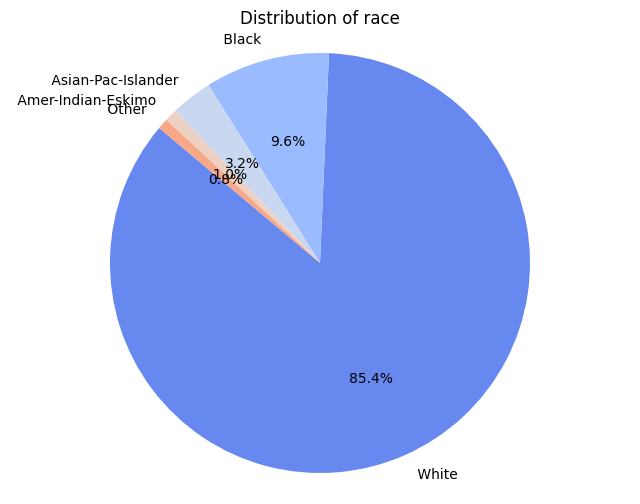

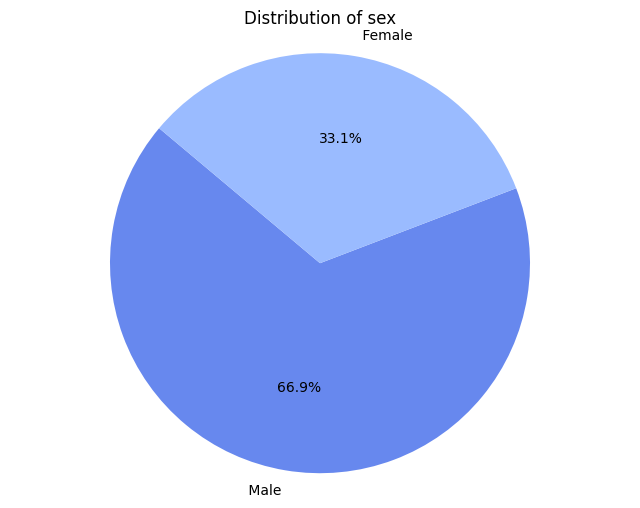

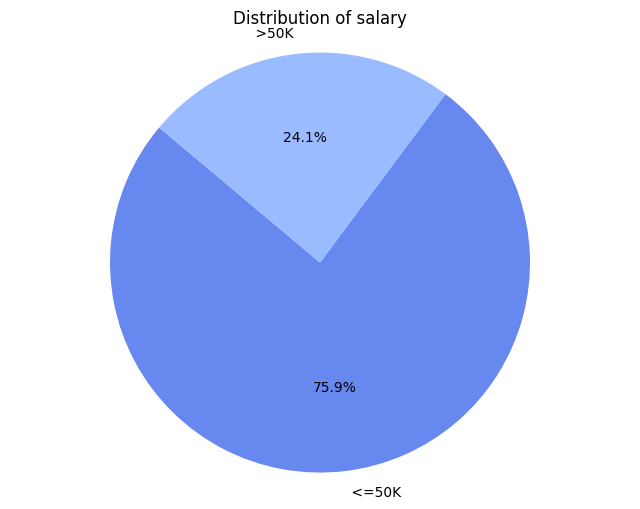

In [32]:
 PlotPie(df)

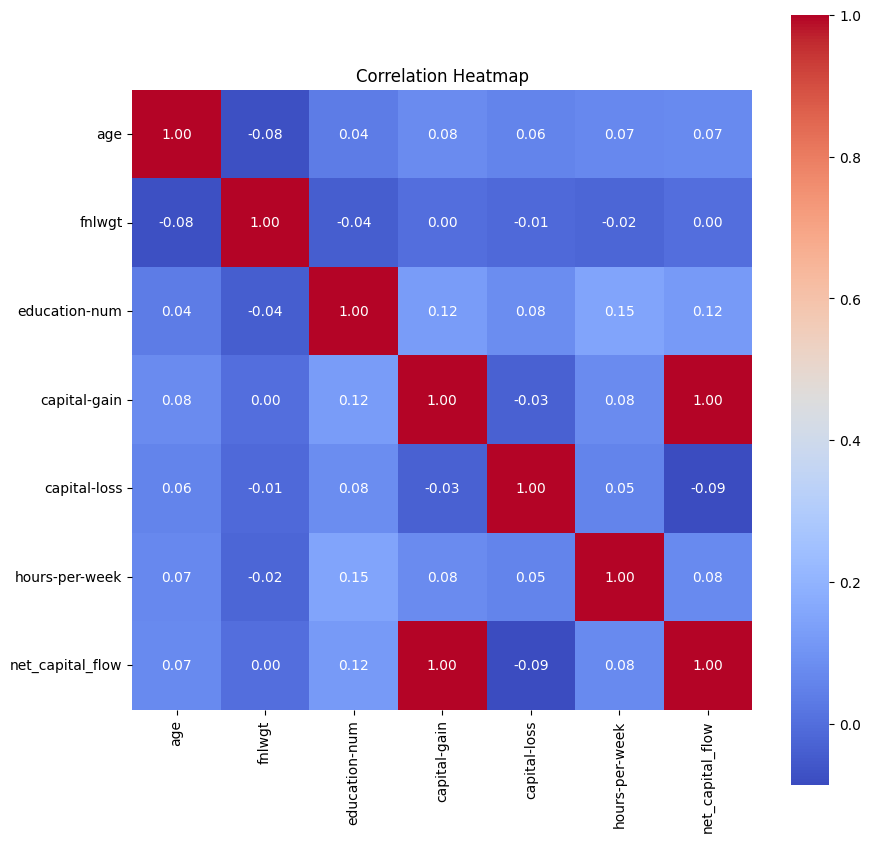

In [33]:
PlotCorrelationHeatmap(df)

<Figure size 1000x800 with 0 Axes>

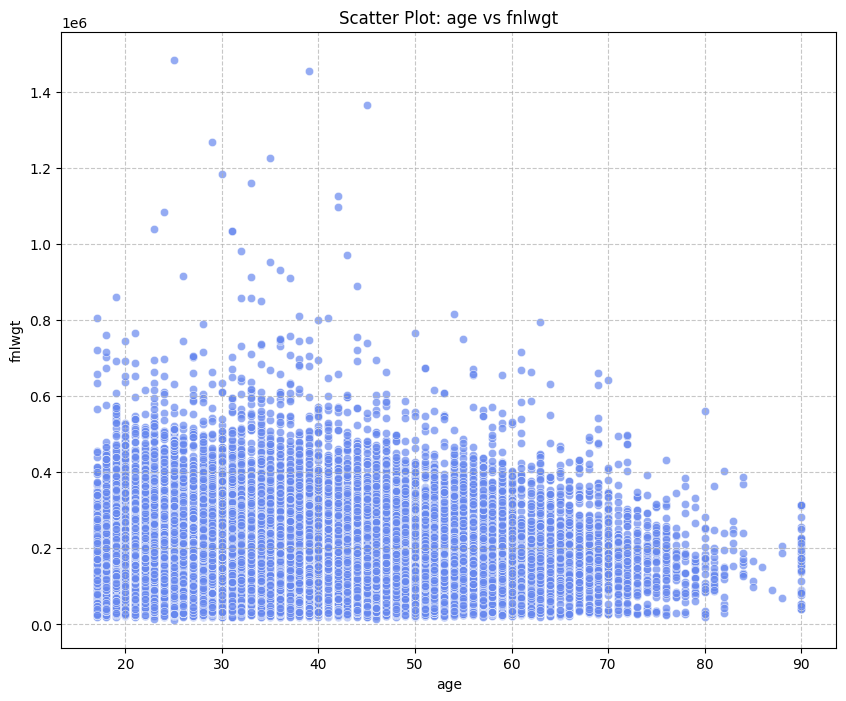

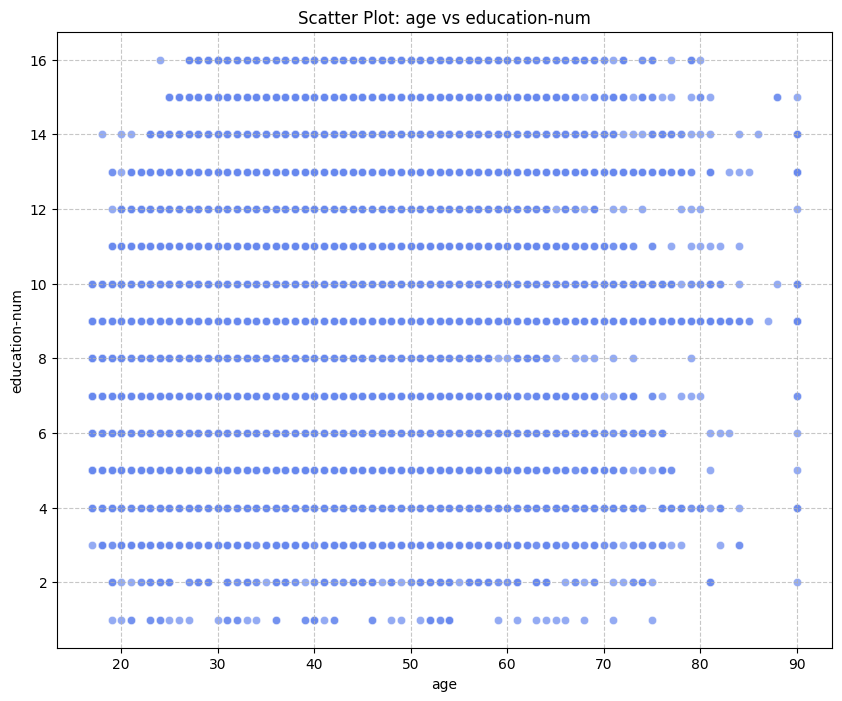

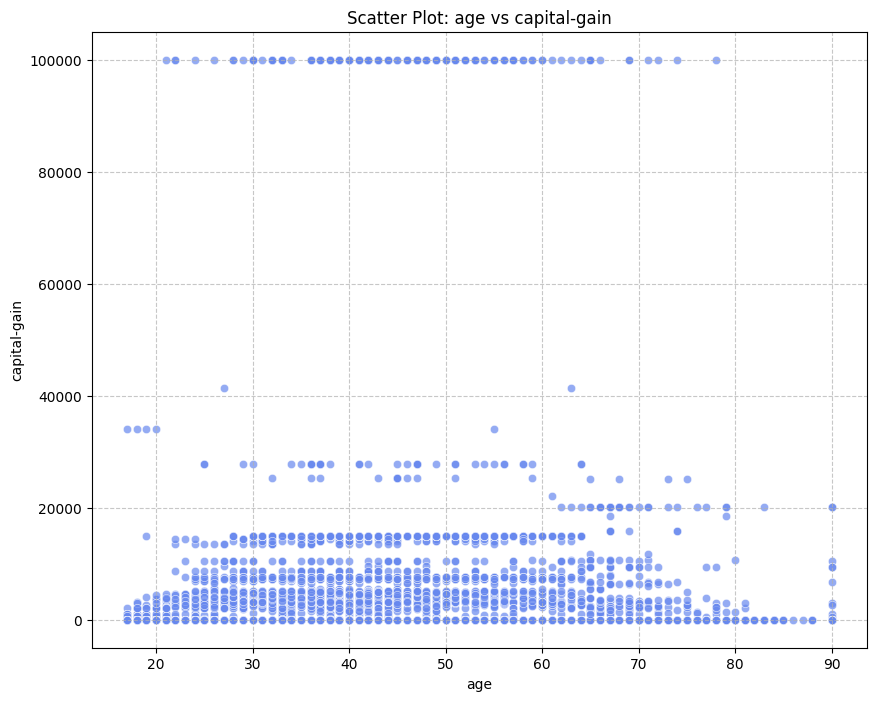

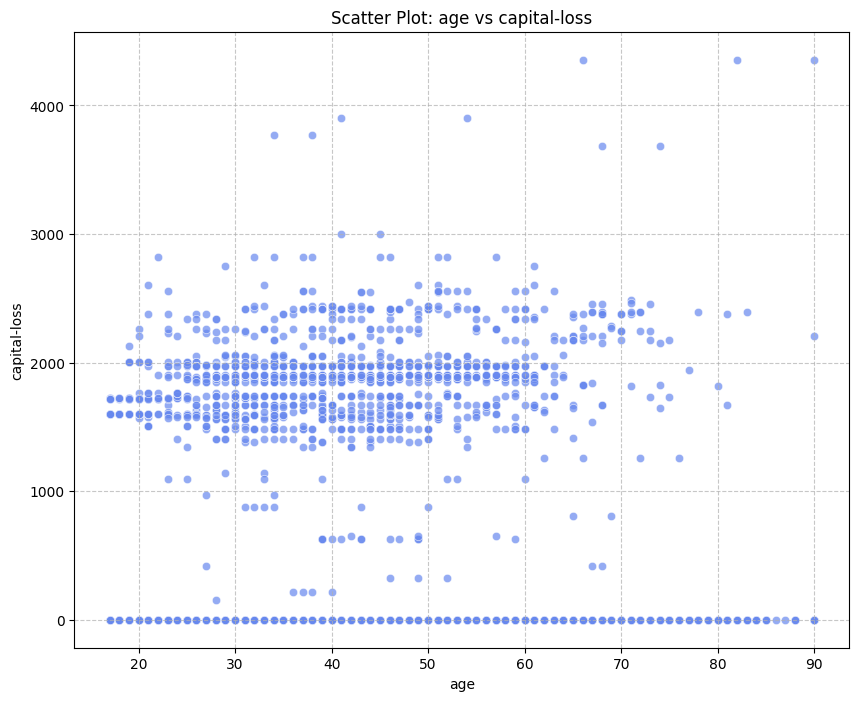

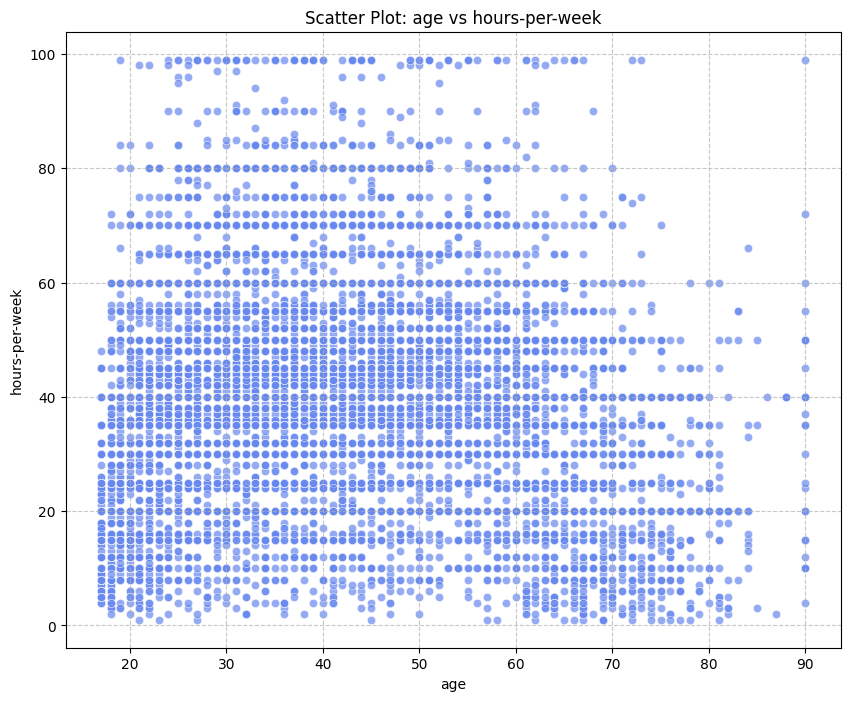

...

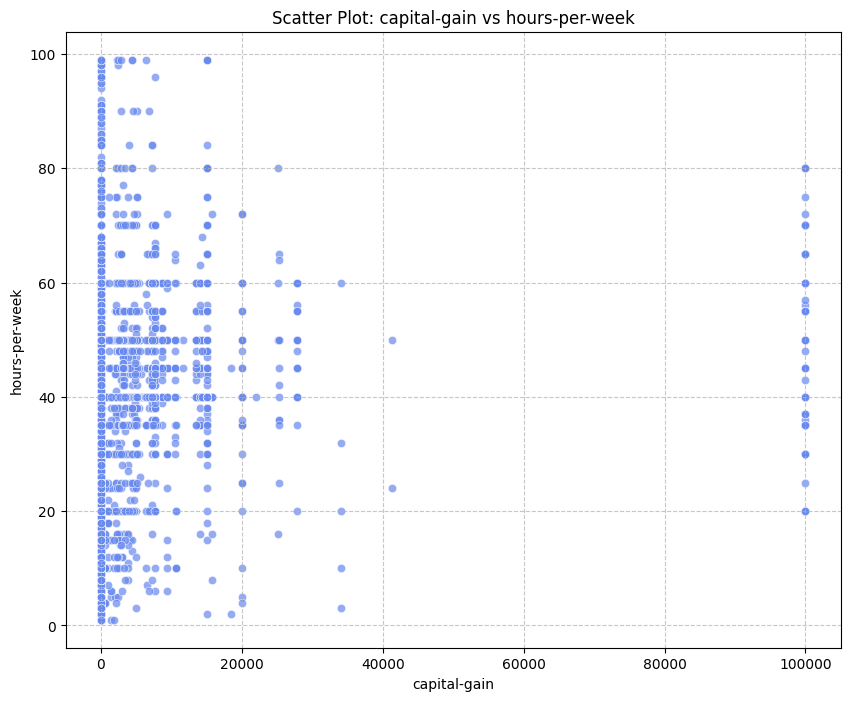

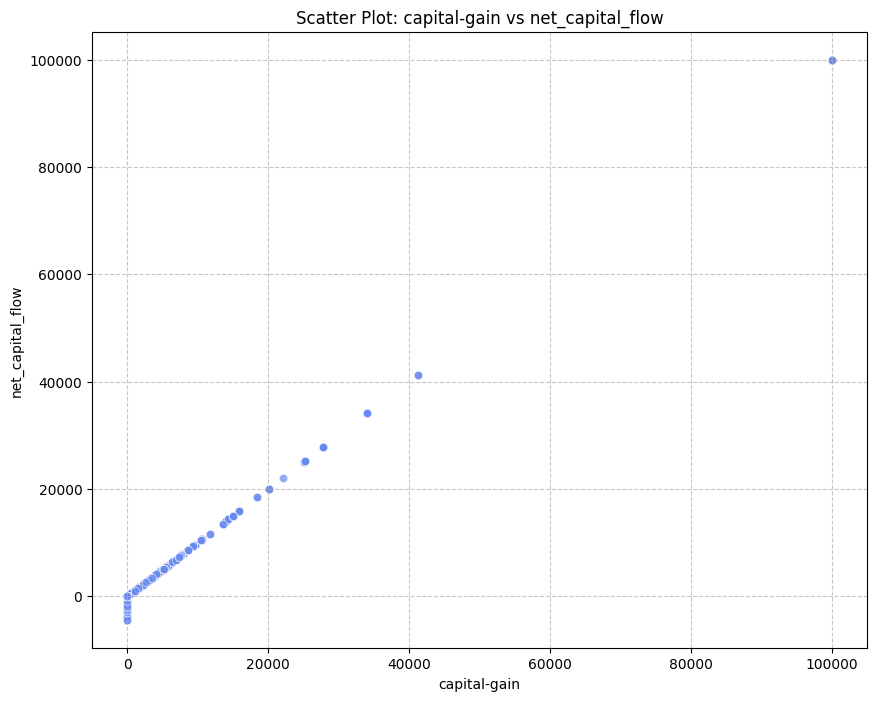

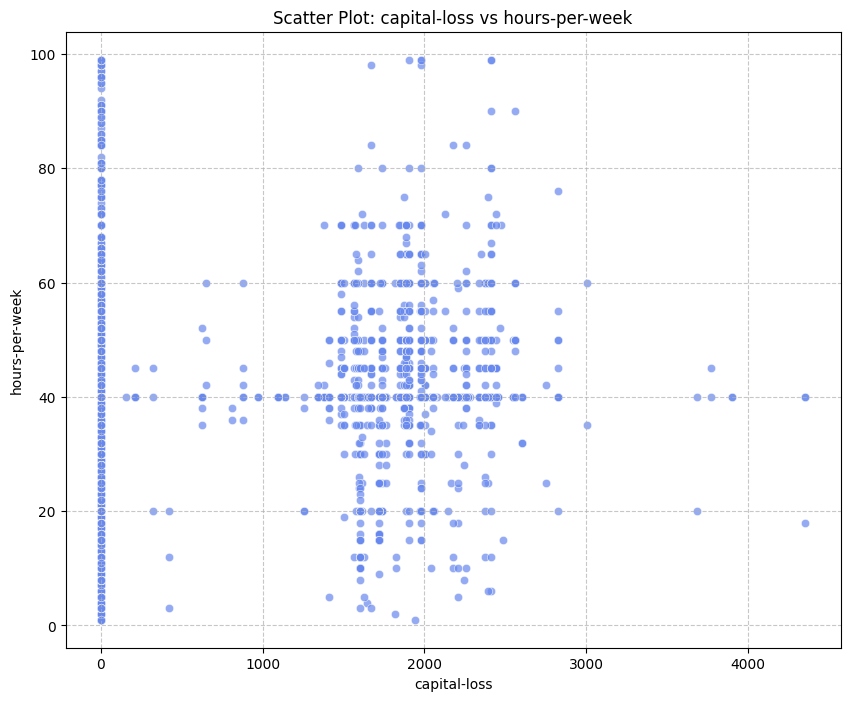

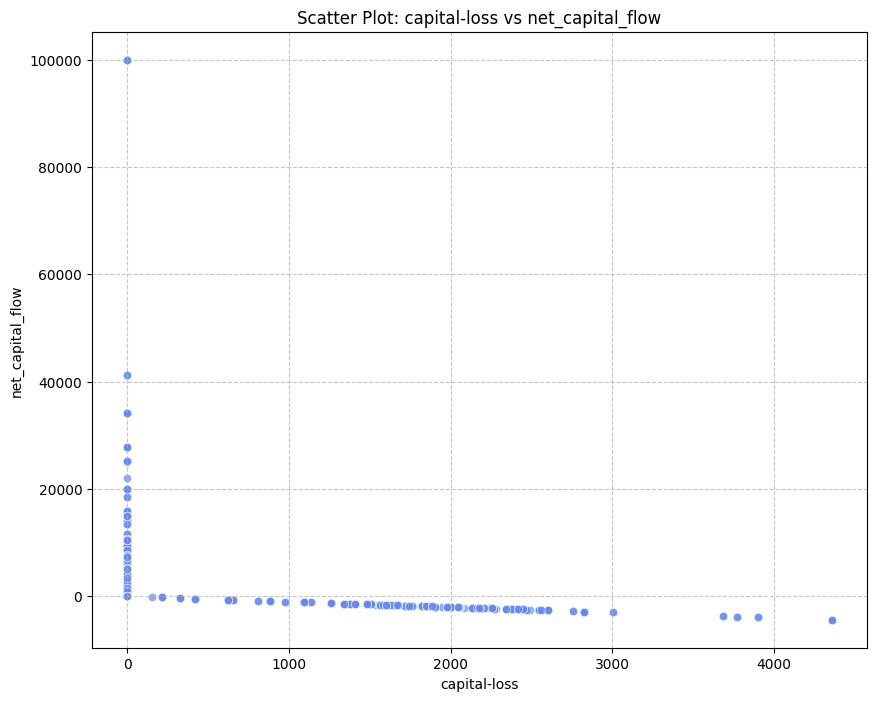

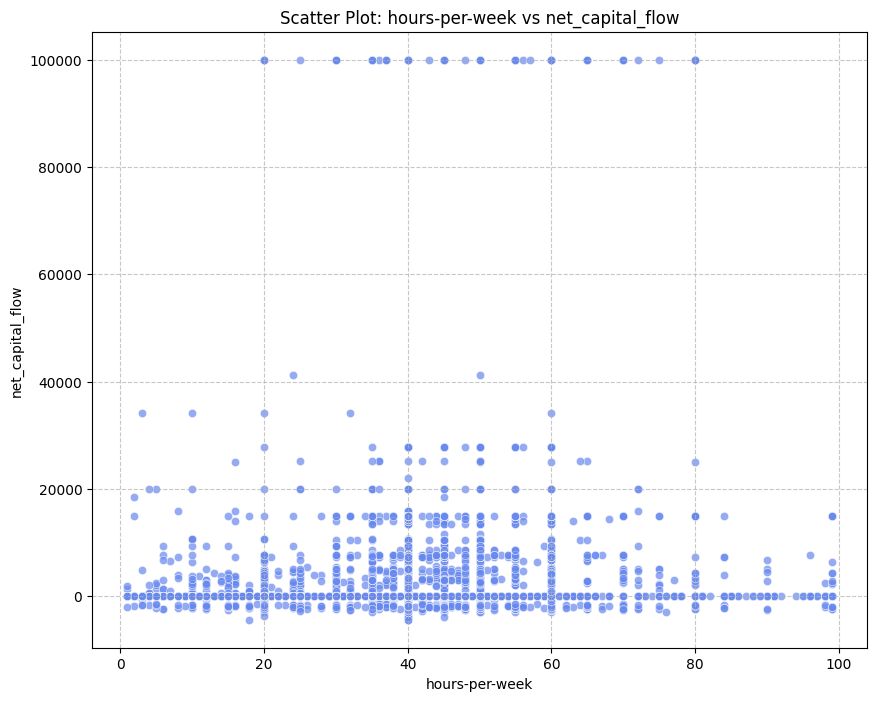

In [34]:
 PlotScatter(df)

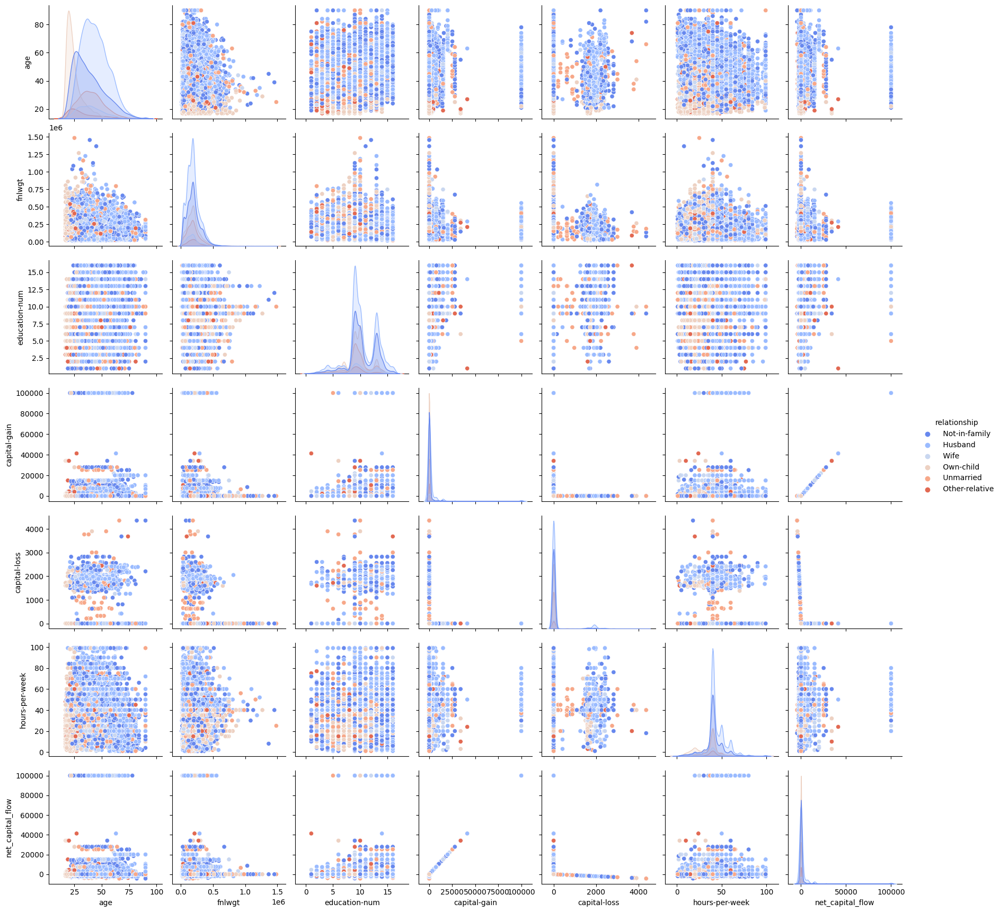

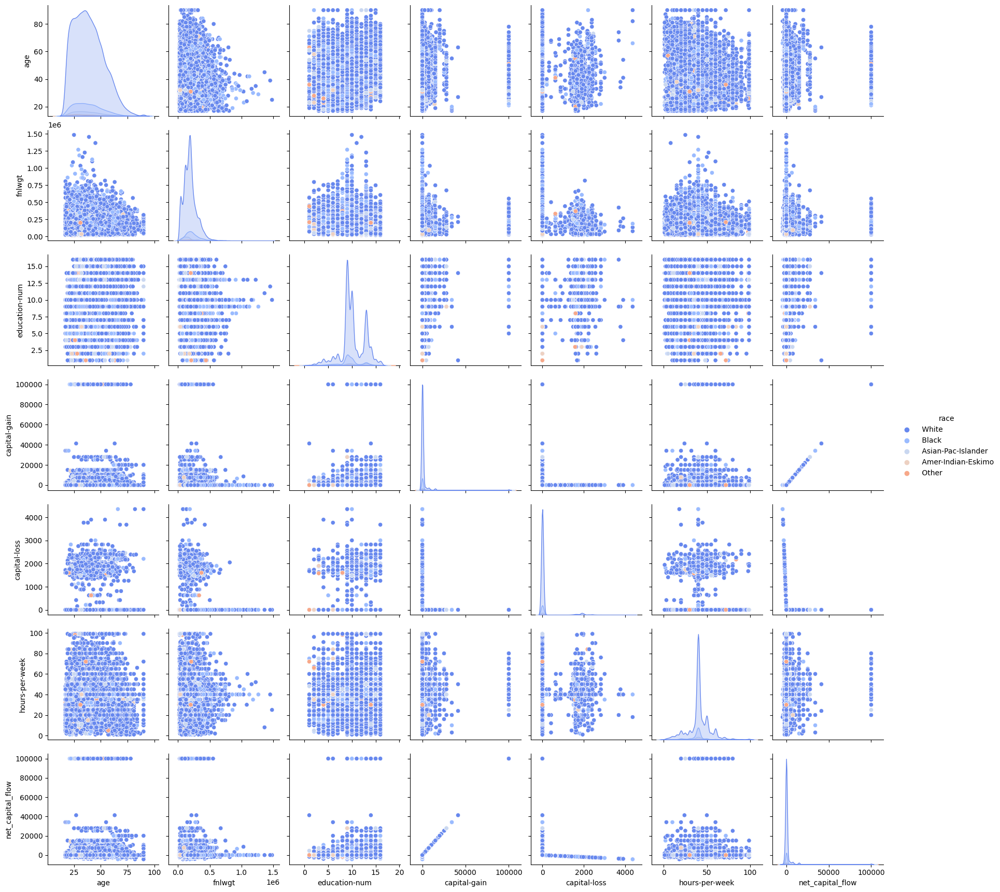

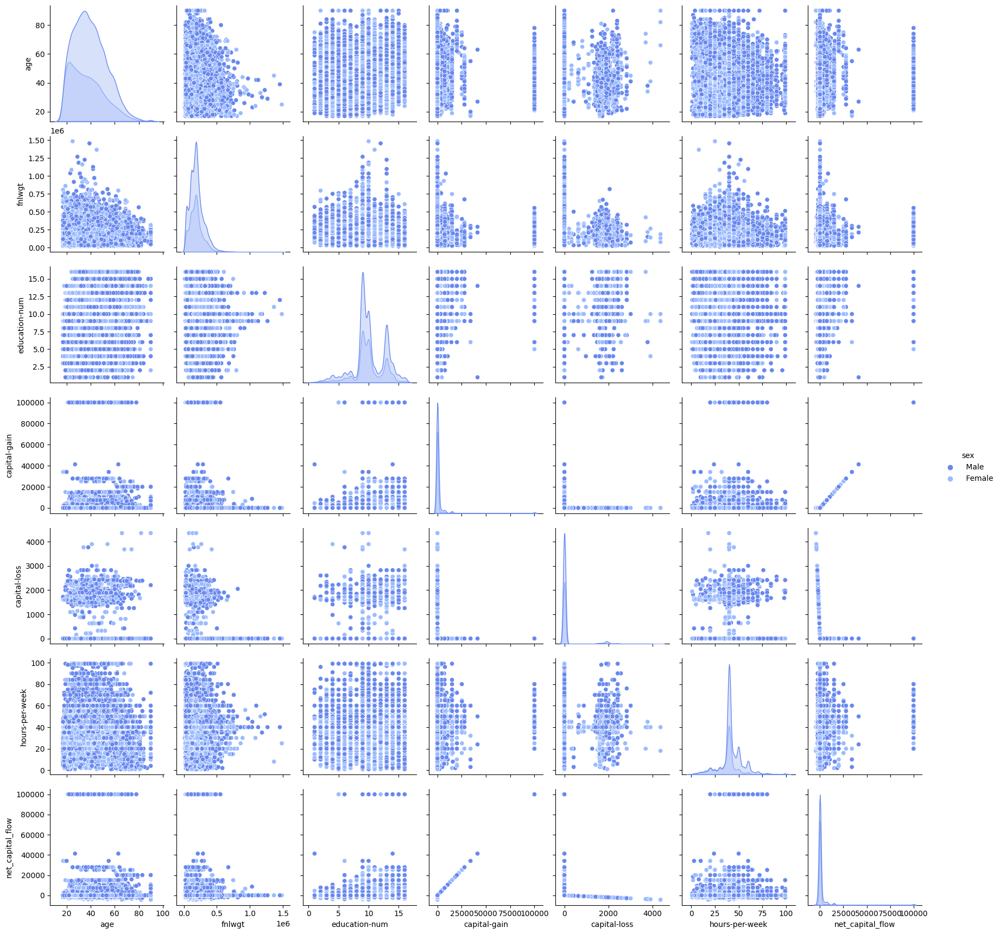

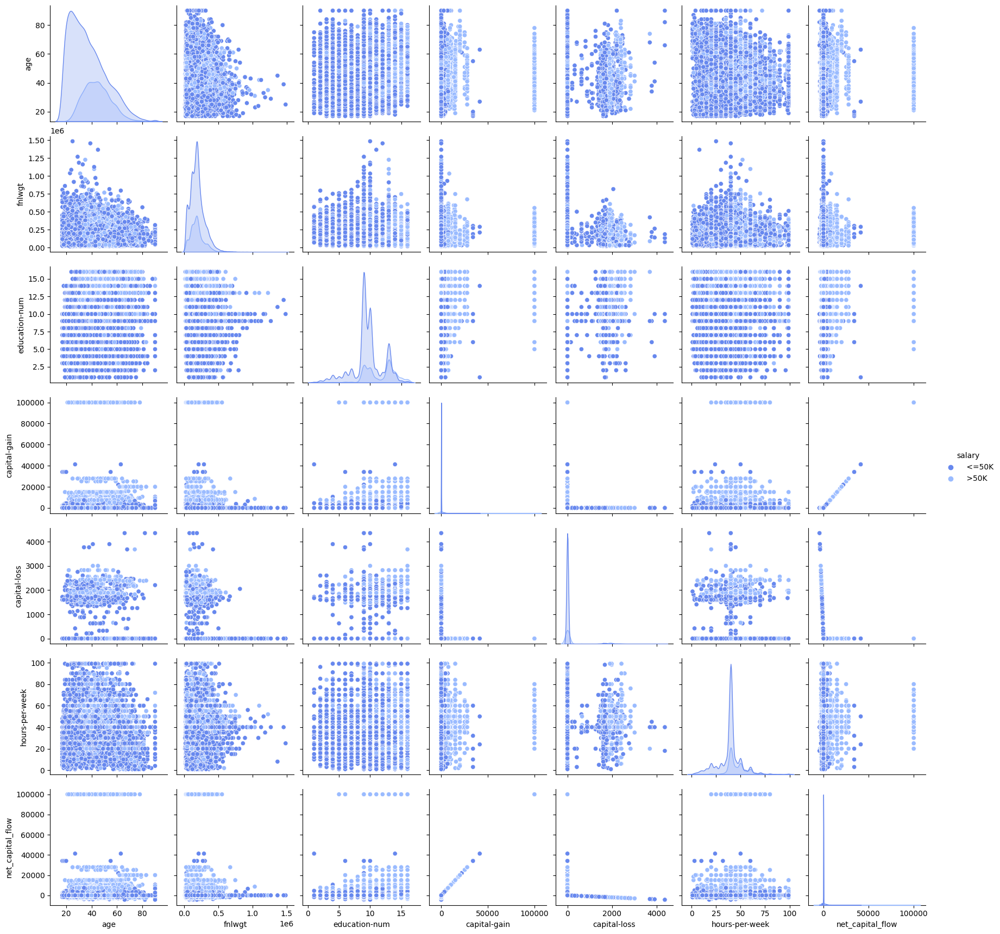

In [35]:
 TribleP(df)

In [36]:
df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary,net_capital_flow
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K,2174
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K,0
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K,0
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K,0


# **Preprocessing Operations :**

In [37]:
encoder = LabelEncoder()

def preprocess(df):
    # Remove duplicates
    df = df.drop_duplicates()

    # Label encoding for categorical features
    df['salary'] = encoder.fit_transform(df['salary'])
    df['sex'] = encoder.fit_transform(df['sex'])
    df['native-country'] = encoder.fit_transform(df['native-country'])
    df['marital-status'] = encoder.fit_transform(df['marital-status'])

    # Cleaning and transforming workclass
    df['workclass'] = df['workclass'].str.strip()
    allowed_workclass = ['Private', 'Self-emp-not-inc', 'Local-gov']
    df['workclass'] = df['workclass'].apply(lambda val: val if val in allowed_workclass else 'other')

    # Cleaning and transforming education
    df['education'] = df['education'].str.strip()
    allowed_edu = ['HS-grad', 'Some-college', 'Bachelors', 'Masters', 'Assoc-voc', 'Assoc-acdm', 'Doctorate']
    df['education'] = df['education'].apply(lambda val: val if val in allowed_edu else 'School')
    education_order = ['HS-grad', 'School', 'Assoc-voc', 'Assoc-acdm', 'Some-college', 'Bachelors', 'Masters', 'Doctorate']
    ord_encoder = OrdinalEncoder(categories=[education_order])
    df['education'] = ord_encoder.fit_transform(df[['education']])

    # One-hot encoding for workclass, race, and relationship
    df = pd.get_dummies(df, columns=['workclass'], drop_first=True, dtype=int)
    df = pd.get_dummies(df, columns=['race'], drop_first=True, dtype=int)
    df = pd.get_dummies(df, columns=['relationship'], drop_first=True, dtype=int)

    # Cleaning and encoding occupation
    df['occupation'] = df['occupation'].str.strip()
    mode_value = df['occupation'].mode()[0]
    df['occupation'] = df['occupation'].replace('?', mode_value)
    df['occupation'] = encoder.fit_transform(df['occupation'])

    # Apply RobustScaler to all columns
    # scaler = RobustScaler()
    # df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

    return df


In [38]:
df['salary'].value_counts()
df = preprocess(df)
df['salary'].dtypes


dtype('int64')

# Exploration after the Pre-Processing :

In [39]:
df["salary"].value_counts()

salary
0    24698
1     7839
Name: count, dtype: int64

In [40]:
df['salary'].value_counts(normalize=True) * 100

salary
0    75.907428
1    24.092572
Name: proportion, dtype: float64

In [41]:
df['salary']

0        0
1        0
2        0
3        0
4        0
        ..
32556    0
32557    1
32558    0
32559    0
32560    1
Name: salary, Length: 32537, dtype: int64

In [42]:
df.head()

,age,fnlwgt,education,education-num,marital-status,occupation,sex,capital-gain,capital-loss,hours-per-week,...,workclass_other,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife
0,39,77516,5.0,13,4,0,1,2174,0,40,...,1,0,0,0,1,1,0,0,0,0
1,50,83311,5.0,13,2,3,1,0,0,13,...,0,0,0,0,1,0,0,0,0,0
2,38,215646,0.0,9,0,5,1,0,0,40,...,0,0,0,0,1,1,0,0,0,0
3,53,234721,1.0,7,2,5,1,0,0,40,...,0,0,1,0,0,0,0,0,0,0
4,28,338409,5.0,13,2,9,0,0,0,40,...,0,0,1,0,0,0,0,0,0,1


In [43]:
df.shape

(32537, 25)

In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32537 entries, 0 to 32560
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   age                           32537 non-null  int64  
 1   fnlwgt                        32537 non-null  int64  
 2   education                     32537 non-null  float64
 3   education-num                 32537 non-null  int64  
 4   marital-status                32537 non-null  int64  
 5   occupation                    32537 non-null  int64  
 6   sex                           32537 non-null  int64  
 7   capital-gain                  32537 non-null  int64  
 8   capital-loss                  32537 non-null  int64  
 9   hours-per-week                32537 non-null  int64  
 10  native-country                32537 non-null  int64  
 11  salary                        32537 non-null  int64  
 12  net_capital_flow              32537 non-null  int64  
 13  workcl

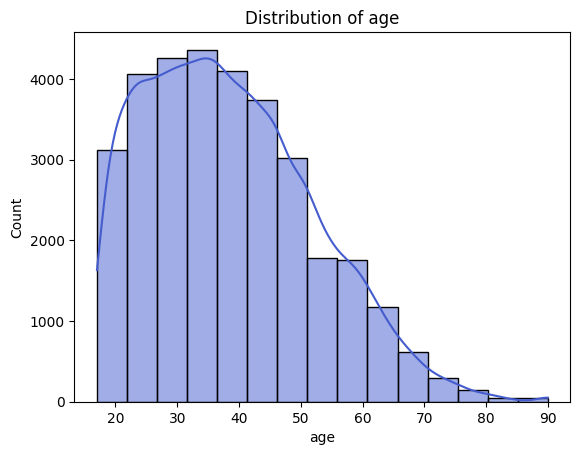

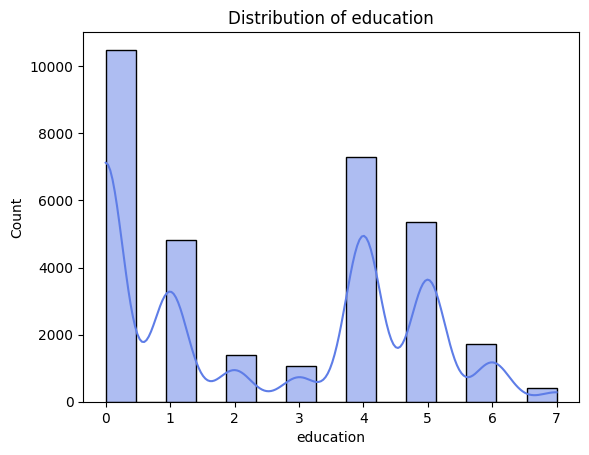

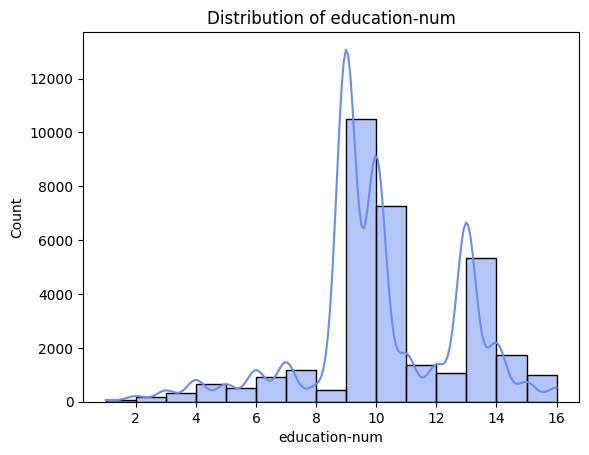

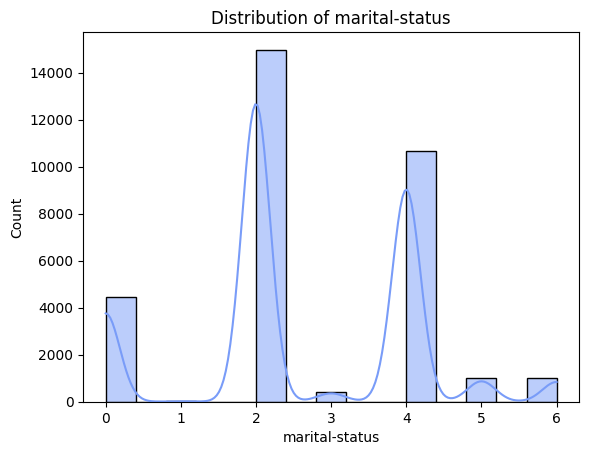

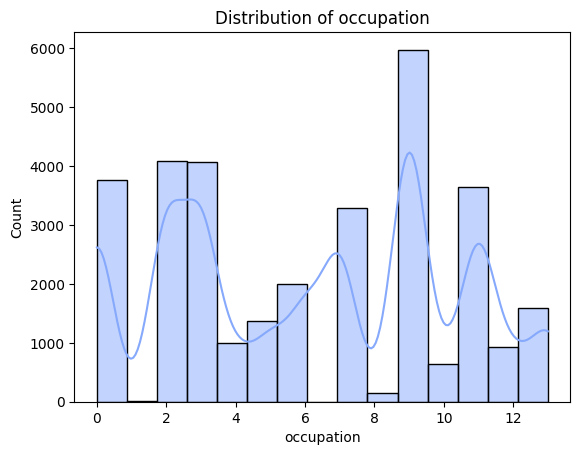

...

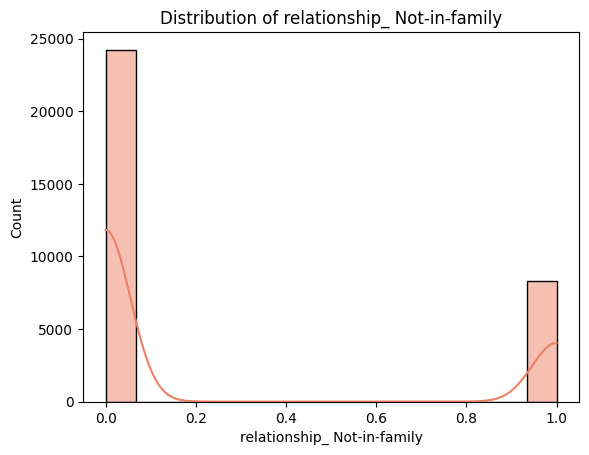

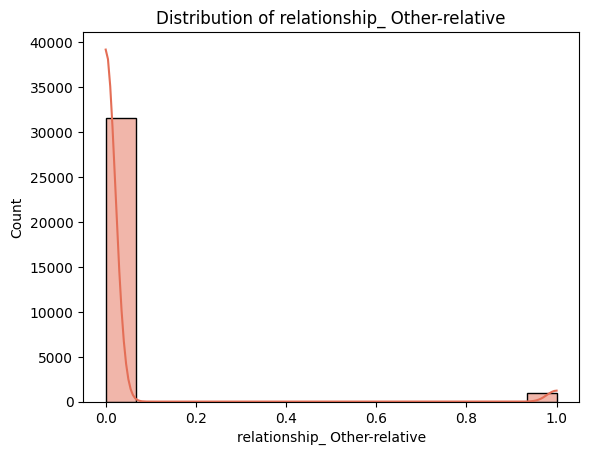

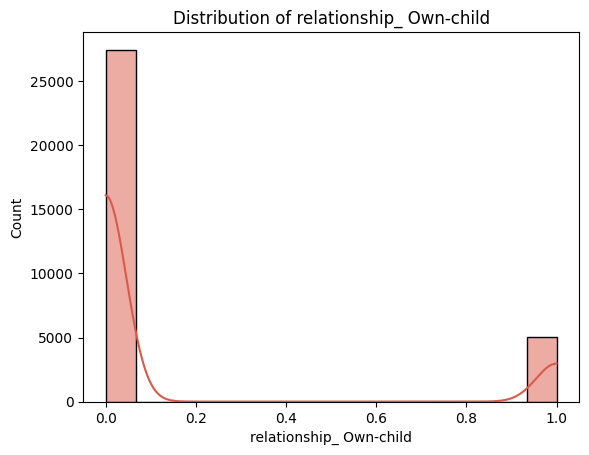

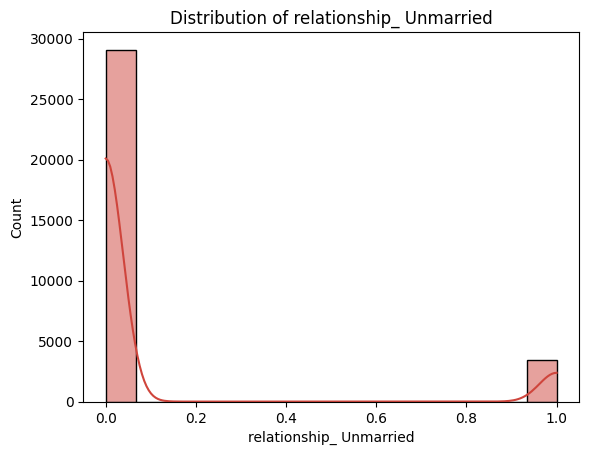

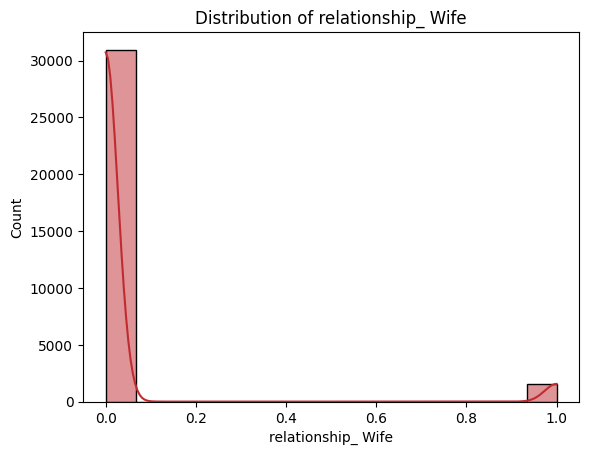

In [45]:
 PDP(df)

# Apply PowerTransformer to the age column

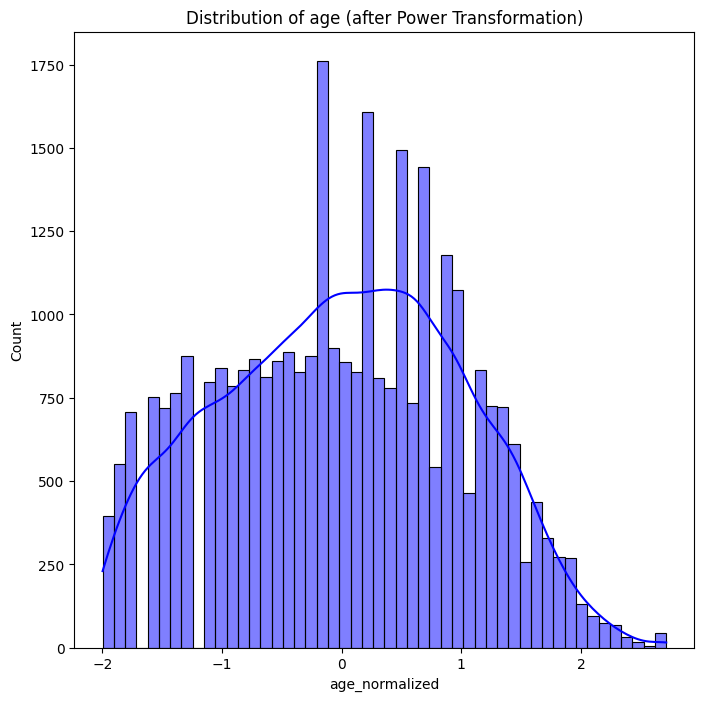

In [46]:
pt = PowerTransformer(method='yeo-johnson')
df['age_normalized'] = pt.fit_transform(df[['age']])
plt.figure(figsize=(8, 8))
sns.histplot(df['age_normalized'], kde=True, color='blue', alpha=0.5)
plt.title("Distribution of age (after Power Transformation)")
plt.show()


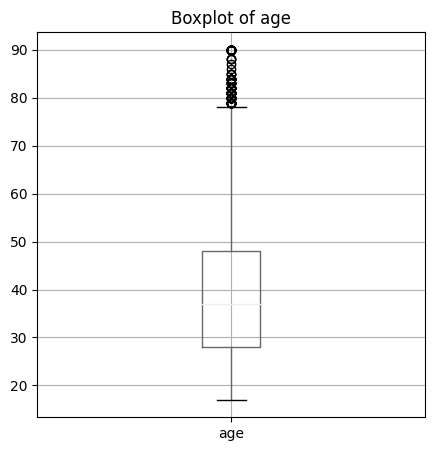

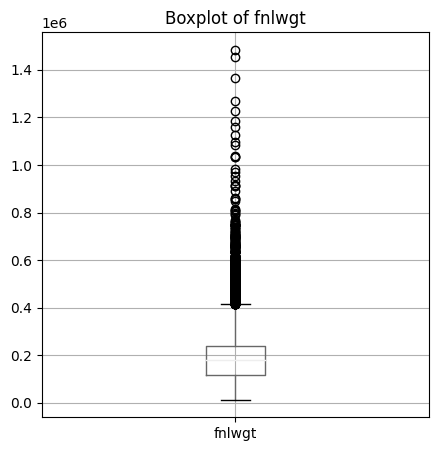

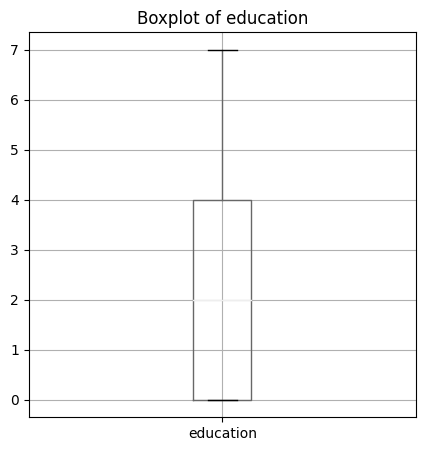

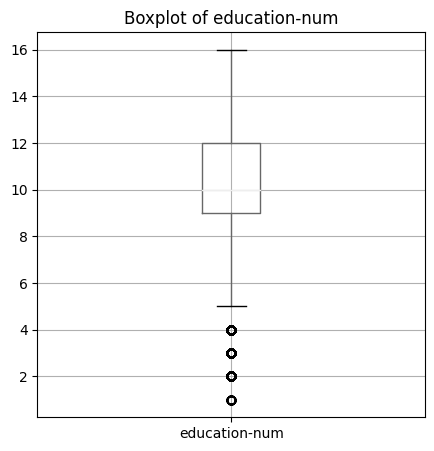

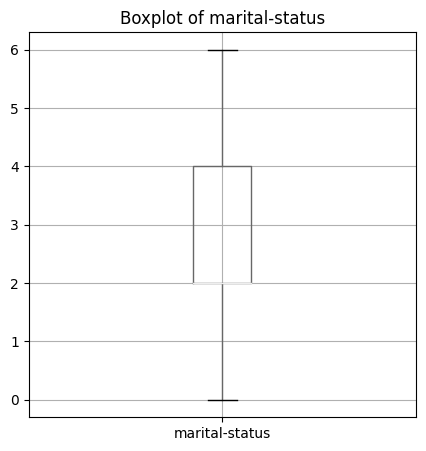

...

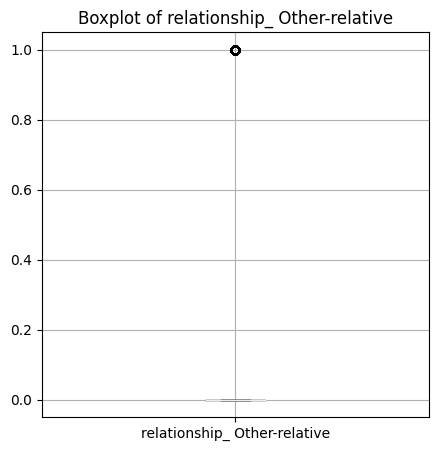

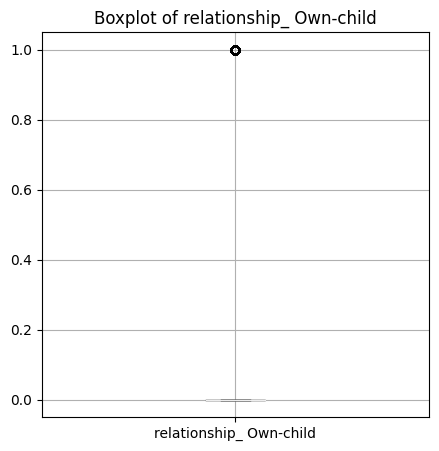

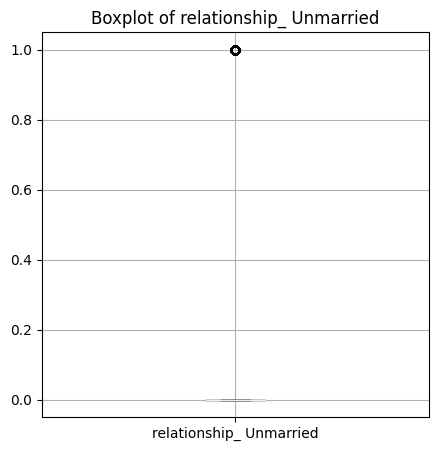

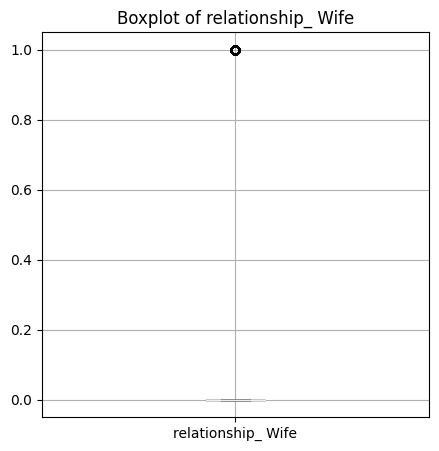

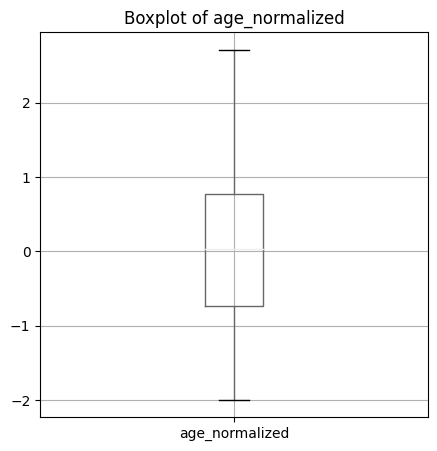

In [47]:
 PBP(df)

In [48]:
df.select_dtypes(include=['object']).columns

Index([], dtype='object')

In [49]:
df['marital-status'].value_counts()

marital-status
2    14970
4    10667
0     4441
5     1025
6      993
3      418
1       23
Name: count, dtype: int64

### Showing the Co-Relation Heatmap After Some Pre-Processing :

### Mestive Here

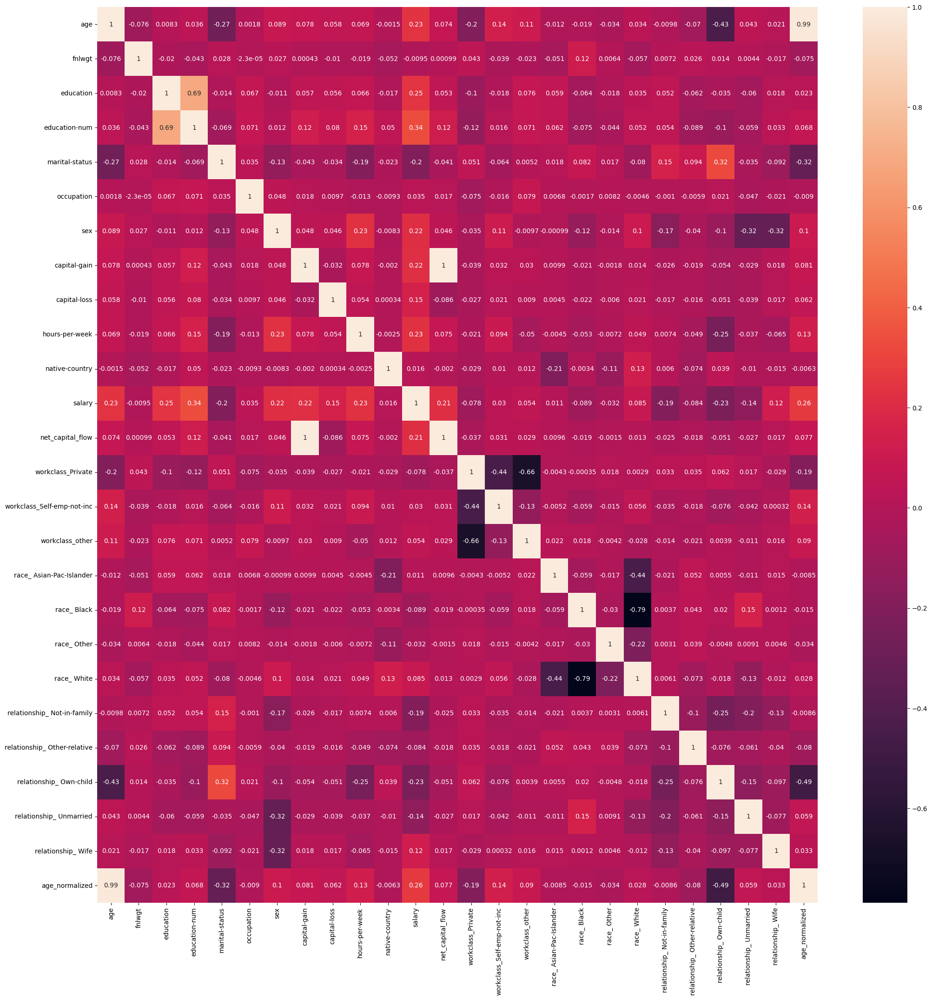

In [50]:
plt.figure(figsize=(25, 25))
sns.heatmap(df.corr(), annot=True)
plt.show()

In [51]:
df.head()

,age,fnlwgt,education,education-num,marital-status,occupation,sex,capital-gain,capital-loss,hours-per-week,...,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,age_normalized
0,39,77516,5.0,13,4,0,1,2174,0,40,...,0,0,0,1,1,0,0,0,0,0.175361
1,50,83311,5.0,13,2,3,1,0,0,13,...,0,0,0,1,0,0,0,0,0,0.891740
2,38,215646,0.0,9,0,5,1,0,0,40,...,0,0,0,1,1,0,0,0,0,0.102251
3,53,234721,1.0,7,2,5,1,0,0,40,...,0,1,0,0,0,0,0,0,0,1.064254
4,28,338409,5.0,13,2,9,0,0,0,40,...,0,1,0,0,0,0,0,0,1,-0.732217


In [52]:
df = df.drop(['age', 'capital-gain', 'race_ Black', 'education','net_capital_flow','fnlwgt'], axis=1)

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32537 entries, 0 to 32560
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   education-num                 32537 non-null  int64  
 1   marital-status                32537 non-null  int64  
 2   occupation                    32537 non-null  int64  
 3   sex                           32537 non-null  int64  
 4   capital-loss                  32537 non-null  int64  
 5   hours-per-week                32537 non-null  int64  
 6   native-country                32537 non-null  int64  
 7   salary                        32537 non-null  int64  
 8   workclass_Private             32537 non-null  int64  
 9   workclass_Self-emp-not-inc    32537 non-null  int64  
 10  workclass_other               32537 non-null  int64  
 11  race_ Asian-Pac-Islander      32537 non-null  int64  
 12  race_ Other                   32537 non-null  int64  
 13  race_ 

# Splitting the Dataset :

In [54]:
X = df.drop('salary' , axis = 1).values
y = df['salary'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3 , stratify=y, random_state=42)

# Experimenting with SMOTE

In [55]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_respalmed = smote.fit_resample(X, y)

In [56]:
from collections import Counter

Counter(y_respalmed)

Counter({0: 24698, 1: 24698})

In [57]:
X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled = train_test_split(X_resampled, y_respalmed, test_size=0.3 , stratify=y_respalmed, random_state=42)

# Experimenting with SMOTEENN

In [58]:
from imblearn.combine import SMOTEENN
smote_enn = SMOTEENN(random_state=3)
X_resampled_enn, y_resampled_enn = smote_enn.fit_resample(X, y)

X_train_enn, X_test_enn, y_train_enn, y_test_enn = train_test_split(X_resampled_enn, y_resampled_enn, test_size=0.3, random_state=42)

In [59]:
from collections import Counter

Counter(y_resampled_enn)

Counter({0: 16857, 1: 17518})

### Applying Standard Scaler for All Groups :

In [60]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
X_train_resampled = sc.fit_transform(X_train_resampled)
X_test_resampled = sc.transform(X_test_resampled)
X_train_enn = sc.fit_transform(X_train_enn)
X_test_enn = sc.transform(X_test_enn)

# Applying some Machine Learning Models :

In [61]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

svc = SVC(kernel='linear')
svc.fit(X_train, y_train)
y_pred = svc.predict(X_test)

print(f"SVM Score (without using anything): {accuracy_score(y_test, y_pred) :.2f}")

SVM Score (without using anything): 0.83


# SVM Score Using SMOTEENN:

In [62]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

svc_een = SVC(kernel='rbf')
svc.fit(X_train_enn, y_train_enn)
y_pred_een = svc.predict(X_test_enn)

print("SVM Score Using SMOTEENN:")
accuracy_score(y_test_enn, y_pred_een) 

SVM Score Using SMOTEENN:


0.913507223892175

In [63]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier

In [64]:
models = {
    "SVM": SVC(kernel='rbf'),
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "XGBoost": XGBClassifier(),
    "Voting Classifier": VotingClassifier(estimators=[('lr', LogisticRegression()), ('rf', RandomForestClassifier()), ('gb', GradientBoostingClassifier()), ('ab', AdaBoostClassifier()), ('xgb', XGBClassifier())], voting='hard'),
    "Bagging Classifier": BaggingClassifier(estimator=DecisionTreeClassifier(random_state=42), n_estimators=100, random_state=42),
    "KNN": KNeighborsClassifier(),
}

In [65]:
from sklearn.model_selection import KFold, cross_val_score

results = []

for model in models.values():
    kf = KFold(n_splits=6, random_state=42, shuffle=True)
    cv_results = cross_val_score(model, X_train_resampled, y_train_resampled, cv=kf)
    results.append(cv_results)

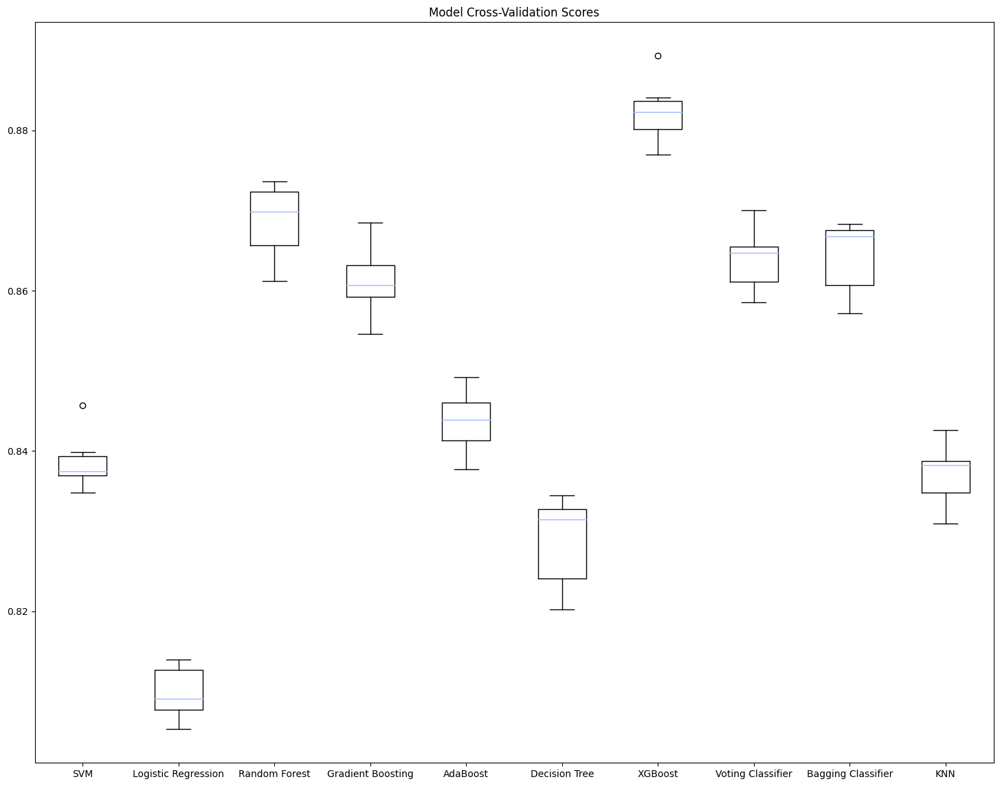

In [66]:
plt.figure(figsize=(18, 14))
plt.boxplot(results, labels=models.keys())
plt.title("Model Cross-Validation Scores")
plt.show()

# Models Evaluation using SMOTE over sampling :

In [67]:
scores = []

for name, model in models.items():
    model.fit(X_train_resampled, y_train_resampled)
    train_score = model.score(X_train_resampled, y_train_resampled)
    test_score = model.score(X_test_resampled, y_test_resampled)
    scores.append((name, train_score, test_score))

scores_df = pd.DataFrame(scores, columns=['Model', 'Train Score', 'Test Score'])

scores_df = scores_df.sort_values(by='Test Score', ascending=False)
scores_df.reset_index(drop=True, inplace=True)

def evaluate_fit(train_score, test_score, threshold=0.05):
    if train_score - test_score > threshold:
        return 'Overfitting'
    elif test_score - train_score > threshold:
        return 'Underfitting'
    else:
        return 'Good'

scores_df['Fit Evaluation'] = scores_df.apply(lambda row: evaluate_fit(row['Train Score'], row['Test Score']), axis=1)

scores_df

,Model,Train Score,Test Score,Fit Evaluation
0,XGBoost,0.902652,0.883393,Good
1,Random Forest,0.981288,0.875565,Overfitting
2,Bagging Classifier,0.981259,0.872461,Overfitting
3,Voting Classifier,0.877954,0.866523,Good
4,Gradient Boosting,0.864563,0.862271,Good
5,AdaBoost,0.844116,0.846278,Good
6,KNN,0.887642,0.842702,Good
7,Decision Tree,0.981317,0.841892,Overfitting
8,SVM,0.845707,0.838383,Good
9,Logistic Regression,0.809845,0.810648,Good


# Models Evaluation using SMOTEENN Balanced Sampling

In [68]:
scores = []

for name, model in models.items():
    model.fit(X_train_enn, y_train_enn)
    train_score = model.score(X_train_enn, y_train_enn)
    test_score = model.score(X_test_enn, y_test_enn)
    scores.append((name, train_score, test_score))

scores_df = pd.DataFrame(scores, columns=['Model', 'Train Score', 'Test Score'])

scores_df = scores_df.sort_values(by='Test Score', ascending=False)
scores_df.reset_index(drop=True, inplace=True)

def evaluate_fit(train_score, test_score, threshold=0.05):
    if train_score - test_score > threshold:
        return 'Overfitting'
    elif test_score - train_score > threshold:
        return 'Underfitting'
    else:
        return 'Good'

scores_df['Fit Evaluation'] = scores_df.apply(lambda row: evaluate_fit(row['Train Score'], row['Test Score']), axis=1)

scores_df

,Model,Train Score,Test Score,Fit Evaluation
0,Random Forest,1.000000,0.973626,Good
1,XGBoost,0.982919,0.970717,Good
2,Bagging Classifier,1.000000,0.963929,Good
3,Voting Classifier,0.958815,0.953651,Good
4,Decision Tree,1.000000,0.948124,Overfitting
5,Gradient Boosting,0.948674,0.947348,Good
6,KNN,0.964633,0.944245,Good
7,AdaBoost,0.939323,0.938912,Good
8,SVM,0.937952,0.937845,Good
9,Logistic Regression,0.911312,0.913701,Good


# Choosing SVM, XGBoost, Random Forest

In [69]:
xgb_params = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
}
rf_params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
}

In [70]:
from sklearn.model_selection import GridSearchCV

xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')

xgb_search = GridSearchCV(xgb_model, xgb_params, cv=5, scoring='accuracy', n_jobs=-1)

In [71]:
xgb_search.fit(X_train_enn, y_train_enn)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='mlogloss', feature_types=None,
                                     gamma=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.8, 1.0],
                         'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.8, 1.0]},
             scoring='accuracy')

In [72]:
y_pred_xgb_search = xgb_search.predict(X_test_enn)
print(f"XGBoost Score with GridSearch: {accuracy_score(y_pred_xgb_search, y_test_enn):.2f}")
print("Best Model")

XGBoost Score with GridSearch: 0.97
Best Model


In [73]:
clf = RandomForestClassifier()
rf_search = GridSearchCV(
    estimator=clf,
    param_grid=rf_params,
    cv=5,
    scoring='accuracy',
    n_jobs=-1
)
rf_search.fit(X_train_enn, y_train_enn)

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [None, 10, 20, 30],
                         'max_features': ['sqrt', 'log2', None],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='accuracy')

In [74]:
print(rf_search.best_params_)
y_pred_rf_search = rf_search.predict(X_test_enn)
print(f"Random Forest (using GridSearch) Score: {accuracy_score(y_pred_rf_search, y_test_enn):.2f}")

{'max_depth': 30, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Random Forest (using GridSearch) Score: 0.97


Accuracy: 0.97
Confusion Matrix:
 [[4950  139]
 [ 135 5089]]


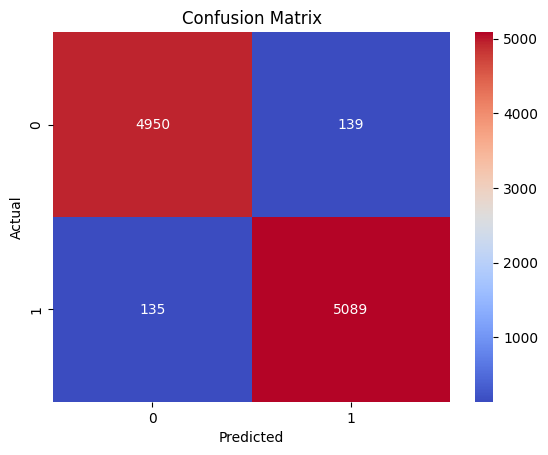

Precision: 0.9734
Recall: 0.9734
F1-Score: 0.9734
ROC-AUC: 0.9734

Classification Report for the model:

                             precision    recall  f1-score   support

Salary is over 50k or equal       0.97      0.97      0.97      5089
    Salary is less than 50k       0.97      0.97      0.97      5224

                   accuracy                           0.97     10313
                  macro avg       0.97      0.97      0.97     10313
               weighted avg       0.97      0.97      0.97     10313


------------------------------------------------------------



In [75]:
EvaluateModel(y_test_enn,y_pred_xgb_search)

# Some Analysis on the Built-In SVM :

In [76]:
coefficients = svc.coef_[0]
importance = np.abs(coefficients)
feature_names = df.drop('salary' , axis = 1).columns

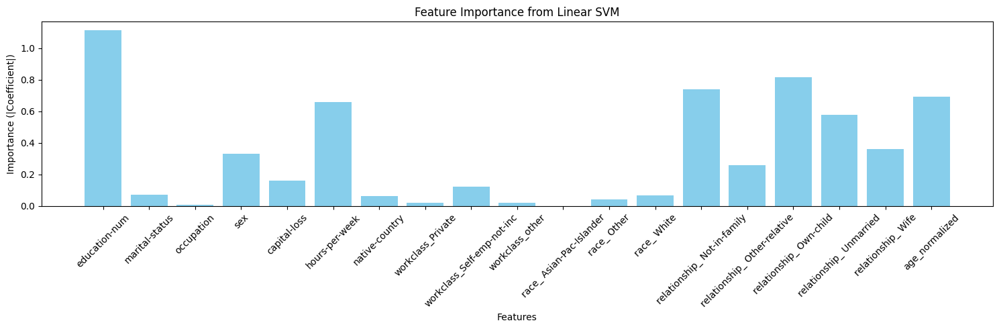

In [77]:
# Plot feature importance
plt.figure(figsize=(15, 5))
plt.bar(feature_names, importance, color='skyblue')
plt.xlabel('Features')
plt.ylabel('Importance (|Coefficient|)')
plt.title('Feature Importance from Linear SVM')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


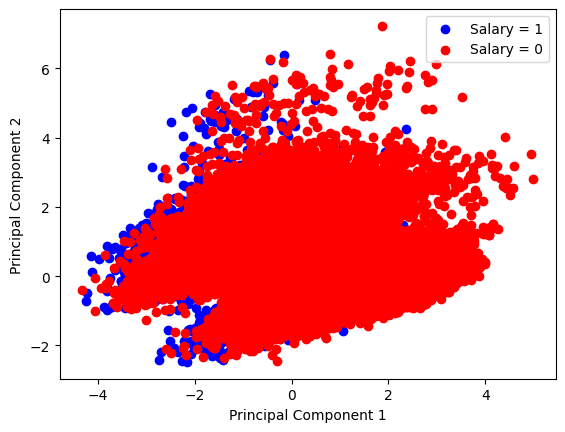

In [78]:
from sklearn.decomposition import PCA

# Apply PCA to reduce to 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train)

# Plot the reduced data
plt.scatter(X_pca[y_train == 1][:, 0], X_pca[y_train == 1][:, 1], color='blue', label='Salary = 1')
plt.scatter(X_pca[y_train == 0][:, 0], X_pca[y_train == 0][:, 1], color='red', label='Salary = 0')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()


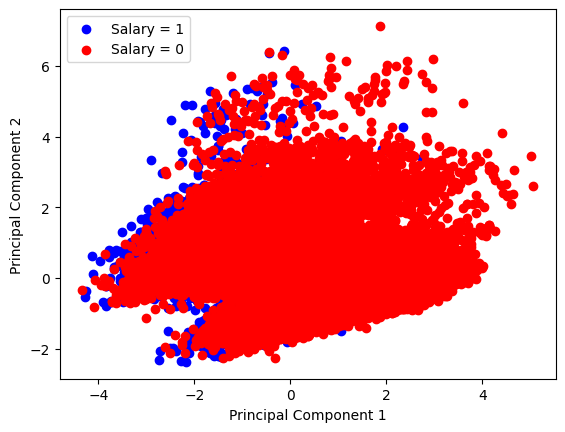

In [79]:
from sklearn.decomposition import PCA

# Apply PCA to reduce to 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train)

# Plot the reduced data
plt.scatter(X_pca[y_train == 1][:, 0], X_pca[y_train == 1][:, 1], color='blue', label='Salary = 1')
plt.scatter(X_pca[y_train == 0][:, 0], X_pca[y_train == 0][:, 1], color='red', label='Salary = 0')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()


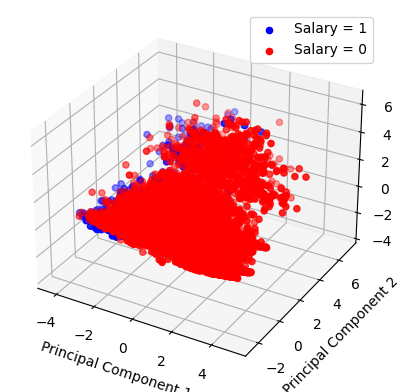

In [80]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Import the 3D plotting toolkit

# Apply PCA to reduce to 3D
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_train)

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the reduced data
ax.scatter(X_pca[y_train == 1][:, 0], X_pca[y_train == 1][:, 1], X_pca[y_train == 1][:, 2], 
           color='blue', label='Salary = 1')
ax.scatter(X_pca[y_train == 0][:, 0], X_pca[y_train == 0][:, 1], X_pca[y_train == 0][:, 2], 
           color='red', label='Salary = 0')

# Add labels
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.legend()

plt.show()
